In [15]:
# Import Library 
import torch
import torchvision
import numpy
import matplotlib.pyplot as plt
import os
import json
from CONFIG import *
from dataset import _Dataset
from util import *
from torchvision.transforms import v2
from tqdm.notebook import tqdm
from model import AttentionUNet, UNet, UNetPlusPlus
from train import train_fn,CombinedLoss,Test

# get device
print ("device is " + DEVICE)


device is cuda


## Data exploration


In [16]:
butterfly_count = 0
b_a_c = 0
squirrel_count = 0
s_a_c = 0

for content in os.listdir(TRAIN_DIR):
    if 'json' in content:
        if 'butterfly' in content:
            b_a_c +=1
        else:
            s_a_c +=1

    else:
        if 'butterfly' in content:
            butterfly_count += 1
        else: 
            squirrel_count +=1

print (f"Butterfly:{butterfly_count}, Mask:{b_a_c} Squirrel{squirrel_count}, Mask:{s_a_c}  ")
    

Butterfly:300, Mask:300 Squirrel300, Mask:300  


Found 600 image files
Found 200 image files
Butterfly height 205,width 246
Squirrel height 264,width 191
Average image height:187.8, Average image width:262.3
Average image height:187.8, Average image width:262.3


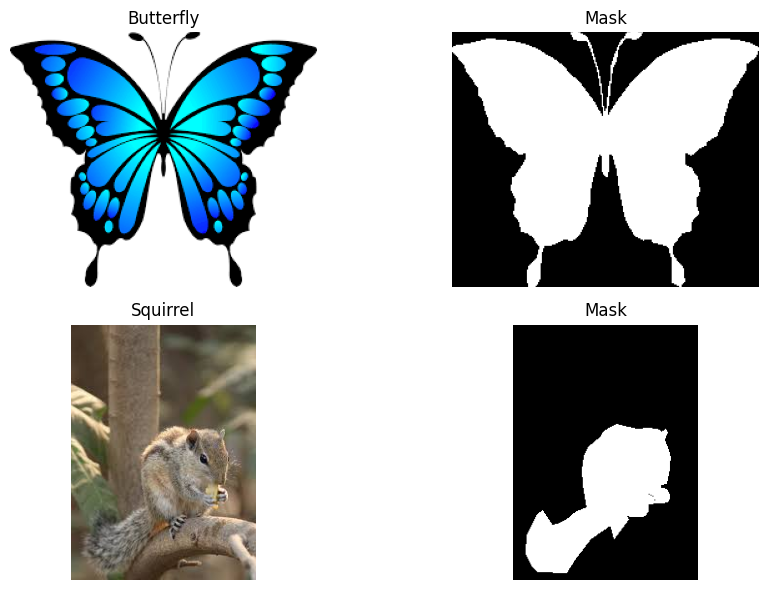

In [17]:
train_dataset = _Dataset(TRAIN_DIR,TRAIN_DIR)
test_dataset = _Dataset(TEST_DIR,TEST_DIR)

image, mask = train_dataset[0]   # assuming __getitem__ returns (img, mask)
s_i, s_m = train_dataset[300]

h0, w0 = image.shape[1], image.shape[2]
hm0, wm0 = mask.shape[0], mask.shape[1]

h1, w1 = s_i.shape[1], s_i.shape[2]
hm1, wm1 = s_m.shape[0], s_m.shape[1]
#tensor get height and width

print(f"Butterfly height {h0},width {w0}")
print(f"Squirrel height {h1},width {w1}")

heights = [img.shape[1] for img, _ in train_dataset]
widths = [img.shape[2] for img, _ in train_dataset]

avg_height = sum(heights)/len(heights)
avg_width = sum(widths)/len(widths)

print(f"Average image height:{avg_height:.1f}, Average image width:{avg_width:.1f}")

image1 , mask1 = to_numpy(image,mask)
s_i1,s_m1 = to_numpy(s_i,s_m)

# plot in 2x2 grid
plt.figure(figsize=(10,6))

plt.subplot(2,2,1)
plt.title("Butterfly")
plt.imshow(image1)
plt.axis("off")

plt.subplot(2,2,2)
plt.title("Mask")
plt.imshow(mask1, cmap="gray")
plt.axis("off")

plt.subplot(2,2,3)
plt.title("Squirrel")
plt.imshow(s_i1)
plt.axis("off")

plt.subplot(2,2,4)
plt.title("Mask")
plt.imshow(s_m1, cmap="gray")
plt.axis("off")

plt.tight_layout()
plt.show()


## Data Genearator + Augmentation 


#### sometimes small dataset need additional data. Augmentation from pytorch can be used.

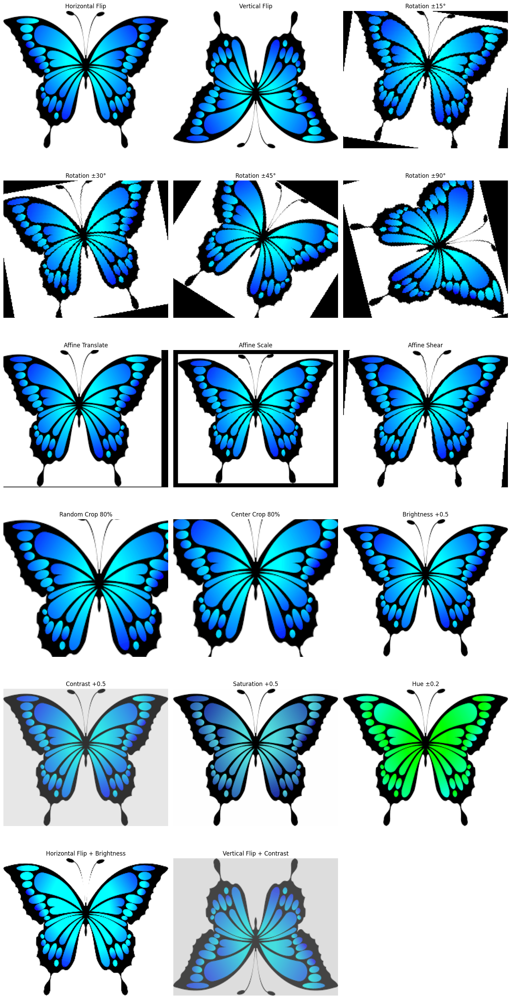

In [18]:
import math
# Pick one original image
image_tensor, _ = train_dataset[0]  # only image, mask ignored

# Same comprehensive augmentation dictionary
augmentations = {
    "Horizontal Flip": v2.RandomHorizontalFlip(p=1.0),
    "Vertical Flip": v2.RandomVerticalFlip(p=1.0),
    "Rotation ±15°": v2.RandomRotation(degrees=15),
    "Rotation ±30°": v2.RandomRotation(degrees=30),
    "Rotation ±45°": v2.RandomRotation(degrees=45),
    "Rotation ±90°": v2.RandomRotation(degrees=90),
    "Affine Translate": v2.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    "Affine Scale": v2.RandomAffine(degrees=0, scale=(0.8, 1.2)),
    "Affine Shear": v2.RandomAffine(degrees=0, shear=10),
    "Random Crop 80%": v2.RandomCrop(size=(int(image_tensor.shape[1]*0.8), int(image_tensor.shape[2]*0.8))),
    "Center Crop 80%": v2.CenterCrop(size=(int(image_tensor.shape[1]*0.8), int(image_tensor.shape[2]*0.8))),
    "Brightness +0.5": v2.ColorJitter(brightness=0.5),
    "Contrast +0.5": v2.ColorJitter(contrast=0.5),
    "Saturation +0.5": v2.ColorJitter(saturation=0.5),
    "Hue ±0.2": v2.ColorJitter(hue=0.2),
    "Horizontal Flip + Brightness": v2.Compose([v2.RandomHorizontalFlip(p=1.0), v2.ColorJitter(brightness=0.5)]),
    "Vertical Flip + Contrast": v2.Compose([v2.RandomVerticalFlip(p=1.0), v2.ColorJitter(contrast=0.5)]),
}

# Horizontal grid setup
cols = 3
num_augs = len(augmentations)
rows = math.ceil(num_augs / cols)

plt.figure(figsize=(cols * 5, rows * 5))

for i, (name, aug) in enumerate(augmentations.items()):
    transform = v2.Compose([aug, v2.ToDtype(torch.float32, scale=True)])
    aug_image = transform(image_tensor)
    image_np = aug_image.permute(1, 2, 0).numpy()
    
    plt.subplot(rows, cols, i + 1)
    plt.imshow(image_np)
    plt.axis('off')
    plt.title(name, fontsize=12)

plt.tight_layout()
plt.show()

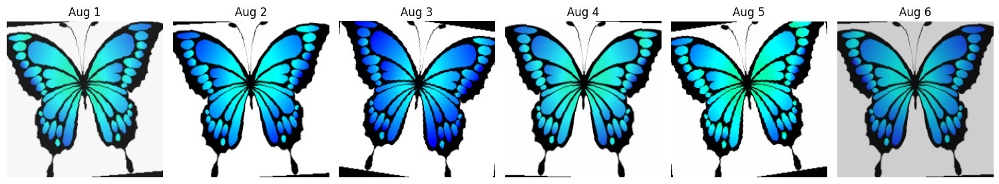

In [19]:

transform_aug = v2.Compose([
    v2.RandomHorizontalFlip(p = 0.5),
    v2.RandomRotation(degrees=10), # small rotation
    v2.RandomResizedCrop(size=(224,224), scale=(0.9,1.0), ratio=(0.9,1.1)),  # minor crop+scale
    v2.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True)
])

# Number of augmented versions to show
num_aug = 6

plt.figure(figsize=(15,3))

for i in range(num_aug):
    aug_image = transform_aug(image_tensor)  # apply augmentation
    
    # Convert tensor to numpy for visualization
    image_np = aug_image.permute(1,2,0).numpy()  # CHW -> HWC
    
    plt.subplot(1, num_aug, i+1)
    plt.imshow(image_np)
    plt.axis('off')
    plt.title(f"Aug {i+1}")

plt.tight_layout()
plt.show()


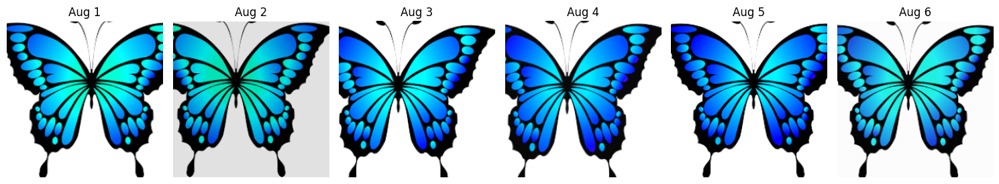

In [20]:
from util import Augmentation

crop_aug = Augmentation.MaskAwareRandomCrop(crop_size=(200,200), margin=10)
del transform_aug.transforms[1]

plt.figure(figsize = (15,3))
for i in range(num_aug):
    img_cropped,_ = crop_aug(image_tensor,_)  # apply augmentation
    
    # Convert tensor to numpy for visualization
    aug_image = transform_aug(img_cropped)
    image_np = aug_image.permute(1,2,0).numpy()  # CHW -> HWC
    
    plt.subplot(1, num_aug, i+1)
    plt.imshow(image_np)
    plt.axis('off')
    plt.title(f"Aug {i+1}")

plt.tight_layout()
plt.show()

### Random Augmentation increase data variety. But since antennae for butterfly is thin. We introduce Mask aware random crop, to enlarge the tiniest feature to be recognized. Vertical flip is not implemented since it will confuse the data. then we compare the augmented pipeline with non augmented under same hyperparameter to compare the result


In [21]:

from util import Augmentation

# image-only photometric post transforms (applied after geometric ops)
img_post = v2.Compose([
    v2.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
])

# 1) plain (resize only)
resize_transform = v2.Compose([
    v2.Resize((IMAGE_HEIGHT, IMAGE_WIDTH)),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
])
train_dataset = _Dataset(TRAIN_DIR, TRAIN_DIR, transform=resize_transform)
test_dataset  = _Dataset(TEST_DIR,  TEST_DIR,  transform=resize_transform)

# 2) image-only augment (NOT synchronized) - keep for comparison
transform_aug = v2.Compose([
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomRotation(degrees=10),
    v2.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.05),
    v2.Resize((IMAGE_HEIGHT, IMAGE_WIDTH)),
    v2.ToImage(),
    v2.ToDtype(torch.float32, scale=True),
])
train_dataset_aug = _Dataset(TRAIN_DIR, TRAIN_DIR, transform=transform_aug)
test_dataset_aug  = _Dataset(TEST_DIR,  TEST_DIR,  transform=transform_aug)

# 3) mask-aware crop + synchronized geometric ops (correct for masks)
crop_aug = Augmentation.MaskAwareRandomCrop(resize_to=None)  # do crop first, then sync geometric + final resize
sync_geom = Augmentation.SynchronizedGeometric(
    hflip_p=0.5,
    vflip_p=0.0,
    rotate_deg=10.0,
    resize_to=(IMAGE_HEIGHT, IMAGE_WIDTH),
    img_post=img_post
)
combined_aug = Augmentation.CombinedAugmentation(crop_aug=crop_aug, transform_pair=sync_geom)

train_dataset_cropaug = _Dataset(TRAIN_DIR, TRAIN_DIR, transform=combined_aug)
test_dataset_cropaug  = _Dataset(TEST_DIR,  TEST_DIR,  transform=combined_aug)


Found 600 image files
Found 200 image files
Found 600 image files
Found 200 image files
Found 600 image files
Found 200 image files


Found 600 image files


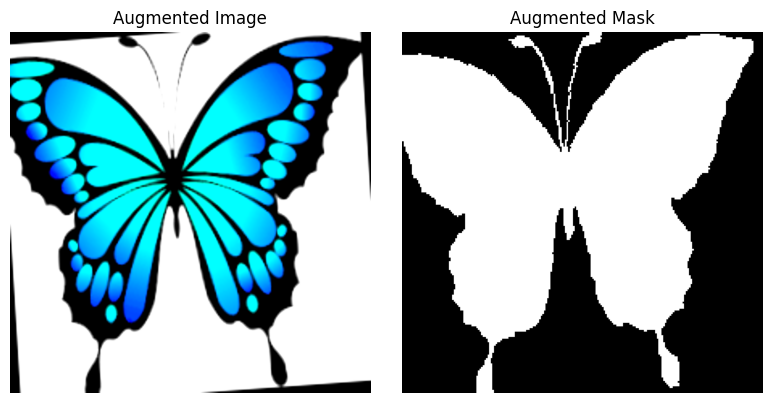

In [22]:
# Visual check: raw sample -> augmented sample (image and mask should stay aligned)
raw_ds = _Dataset(TRAIN_DIR, TRAIN_DIR, transform=None)   # raw data (no transforms)
img_raw, mask_raw = raw_ds[0]    # PIL / tensor depending on your _Dataset implementation

# Apply combined augmentation (pair-wise)
img_t, mask_t = combined_aug(img_raw, mask_raw)

# Convert to numpy for plotting
def to_numpy_for_plot(img, mask):
    # img: CxHxW float [0,1] or PIL -> HxWxC
    if hasattr(img, "shape") and img.ndim == 3:
        img_np = img.permute(1,2,0).cpu().numpy()
    else:
        img_np = v2.ToImage()(img).permute(1,2,0).numpy()
    # mask -> HxW binary
    if hasattr(mask, "shape"):
        m = Augmentation.sanitize_mask(mask)
        m_np = m.squeeze(0).cpu().numpy()
    else:
        m_np = v2.ToImage()(mask)
        m_np = Augmentation.sanitize_mask(m_np).squeeze(0).numpy()
    return img_np, m_np

img_np, m_np = to_numpy_for_plot(img_t, mask_t)

plt.figure(figsize=(8,4))
plt.subplot(1,2,1); plt.title("Augmented Image"); plt.imshow(img_np); plt.axis("off")
plt.subplot(1,2,2); plt.title("Augmented Mask");  plt.imshow(m_np, cmap="gray"); plt.axis("off")
plt.tight_layout(); plt.show()

## Training phase

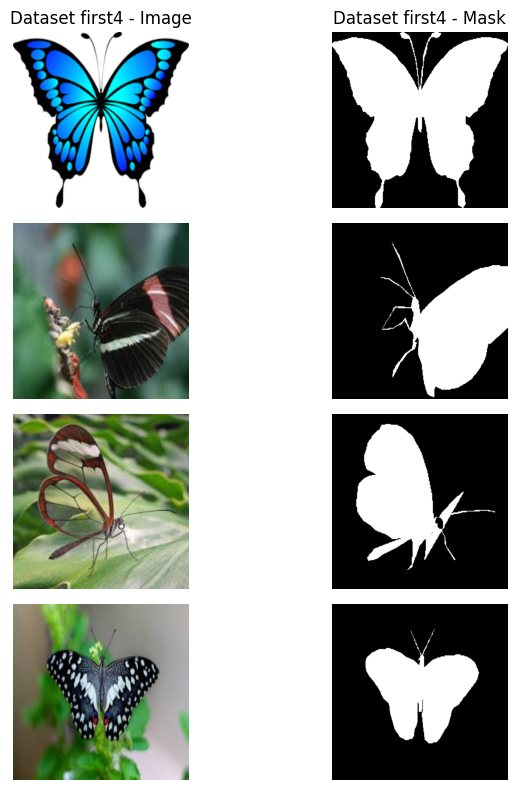

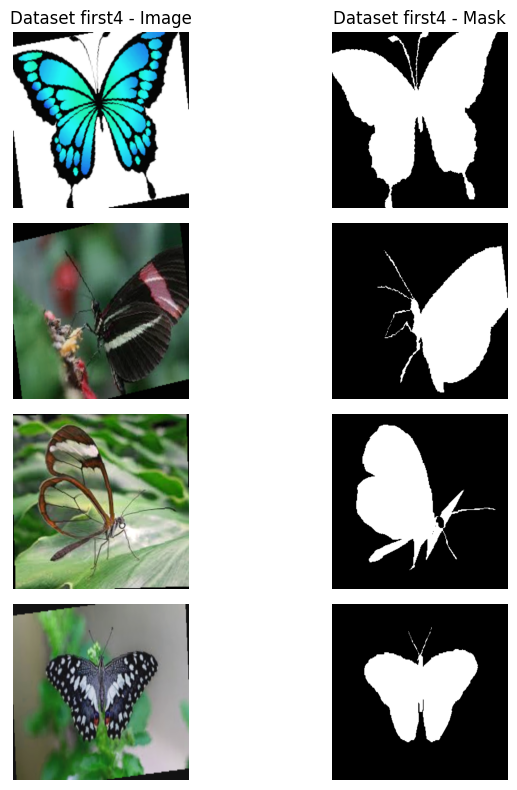

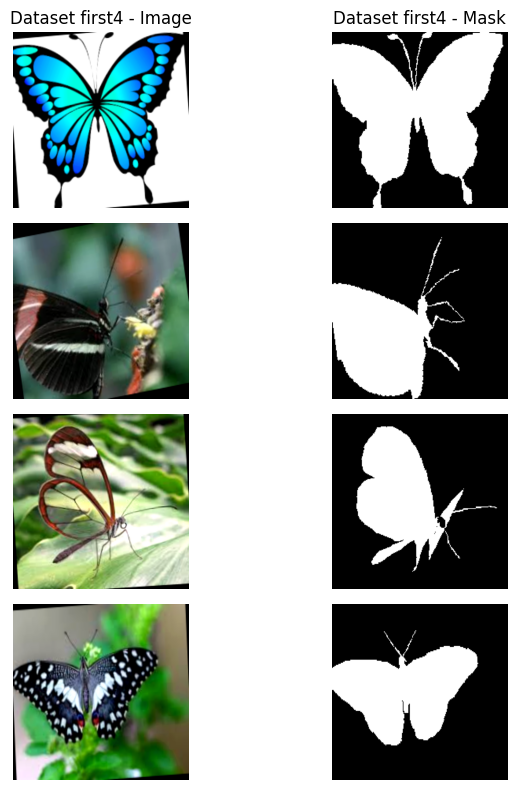

In [23]:
# 1️⃣ Plain dataset
train_loader_plain = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)
test_loader_plain = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

# 2️⃣ Augmentation-only dataset
train_loader_aug = DataLoader(
    train_dataset_aug,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)
test_loader_aug = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

# 3️⃣ Crop + augmentation dataset
train_loader_cropaug = DataLoader(
    train_dataset_cropaug,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)
test_loader_cropaug = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY
)

visualize_samples(train_loader_plain)
visualize_samples(train_loader_aug)
visualize_samples(train_loader_cropaug)

In [24]:
# --- Settings ---
train = True
NUM_EPOCHS = 5
metrics = ["loss", "acc", "dice", "iou"]

results = {n: {m: [] for m in metrics} for n in ("plain", "aug", "crop_aug")}
histories = {n: {m: [] for m in metrics} for n in ("plain", "aug", "crop_aug")}

datasets_train = {"plain": train_loader_plain, "aug": train_loader_aug, "crop_aug": train_loader_cropaug}
datasets_test  = {"plain": test_loader_plain,  "aug": test_loader_aug,  "crop_aug": test_loader_cropaug}

# --- Training / Loading Loop ---
for name in datasets_train.keys():
    checkpoint_path = f"checkpoints/{name}_checkpoint.pth.tar"
    test_loader = datasets_test[name]

    # --- Check if checkpoint exists ---
    if os.path.exists(checkpoint_path):
        chk = torch.load(checkpoint_path, map_location=DEVICE)
        # load history
        h = chk.get("history", {})
        for m in metrics:
            vals = h.get(m, [])
            histories[name][m].extend([float(v) for v in vals])
            results[name][m].extend([float(v) for v in vals])
        print(f"Loaded history for '{name}' ({len(histories[name]['loss'])} epochs).")

        # load model
        model = AttentionUNet(in_channels=3, out_channels=1).to(DEVICE)
        model.load_state_dict(chk["model_state_dict"])
        model.eval()
        print(f"Loaded model checkpoint for '{name}', skipping training.")
        continue  # skip training

    # --- No checkpoint, start training ---
    print(f"\n=== Starting training for dataset: '{name}' ===")
    model = AttentionUNet(in_channels=3, out_channels=1).to(DEVICE)
    opt = optim.AdamW(model.parameters(), lr=LEARNING_RATE)
    loss_fn = CombinedLoss()
    scaler = torch.GradScaler(device=DEVICE)
    train_loader = datasets_train[name]

    for epoch in range(1, NUM_EPOCHS + 1):
        print(f"[{name}] Epoch {epoch}/{NUM_EPOCHS} - training...")
        avg_loss = train_fn(train_loader, model, opt, loss_fn, scaler)
        acc, dice, iou = check_accuracy(test_loader, model, DEVICE)

        # append to histories/results
        for m, v in zip(metrics, [avg_loss, acc, dice, iou]):
            histories[name][m].append(float(v))
            results[name][m].append(float(v))

        print(f"[{name}] Epoch {epoch} done — Loss={avg_loss:.4f}, Acc={acc:.4f}, Dice={dice:.4f}, IoU={iou:.4f}")

        # save checkpoint
        os.makedirs("checkpoints", exist_ok=True)
        save_checkpoint({
            "epoch": epoch,
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": opt.state_dict(),
            "loss": avg_loss,
            "acc": acc,
            "dice": dice,
            "iou": iou,
            "history": histories[name],
        }, filename=checkpoint_path)

Loaded history for 'plain' (5 epochs).
Loaded model checkpoint for 'plain', skipping training.
Loaded history for 'aug' (5 epochs).
Loaded model checkpoint for 'aug', skipping training.
Loaded history for 'aug' (5 epochs).
Loaded model checkpoint for 'aug', skipping training.
Loaded history for 'crop_aug' (5 epochs).
Loaded model checkpoint for 'crop_aug', skipping training.
Loaded history for 'crop_aug' (5 epochs).
Loaded model checkpoint for 'crop_aug', skipping training.


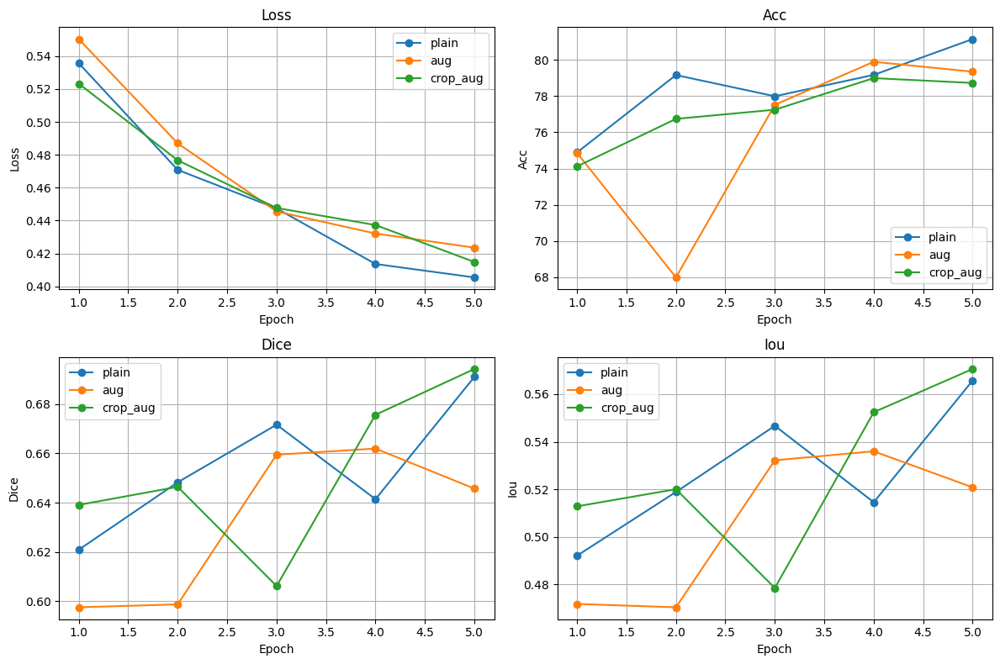

In [25]:

metrics = ["loss", "acc", "dice", "iou"]

plt.figure(figsize=(12, 8))

for i, metric in enumerate(metrics, 1):
    plt.subplot(2, 2, i)
    for name in results:
        y = results[name][metric]
        if len(y) == 0:
            # skip empty series
            continue
        x = range(1, len(y) + 1)
        plt.plot(x, y, marker='o', label=name)
    plt.title(metric.capitalize())
    plt.xlabel("Epoch")
    plt.ylabel(metric.capitalize())
    plt.legend()
    plt.grid(True)

plt.tight_layout()
plt.show()

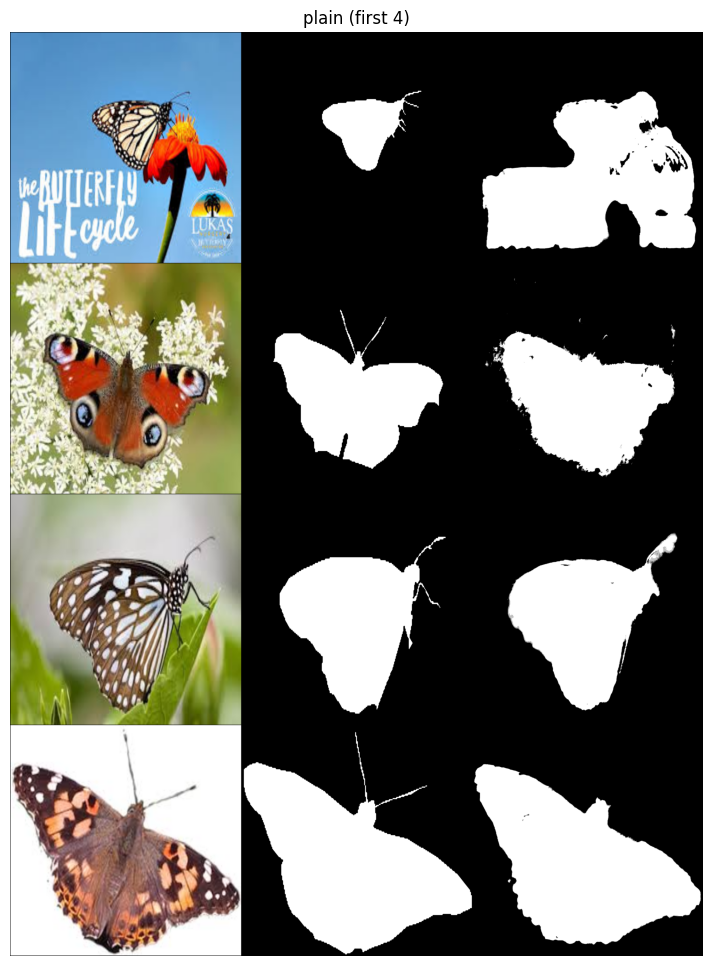

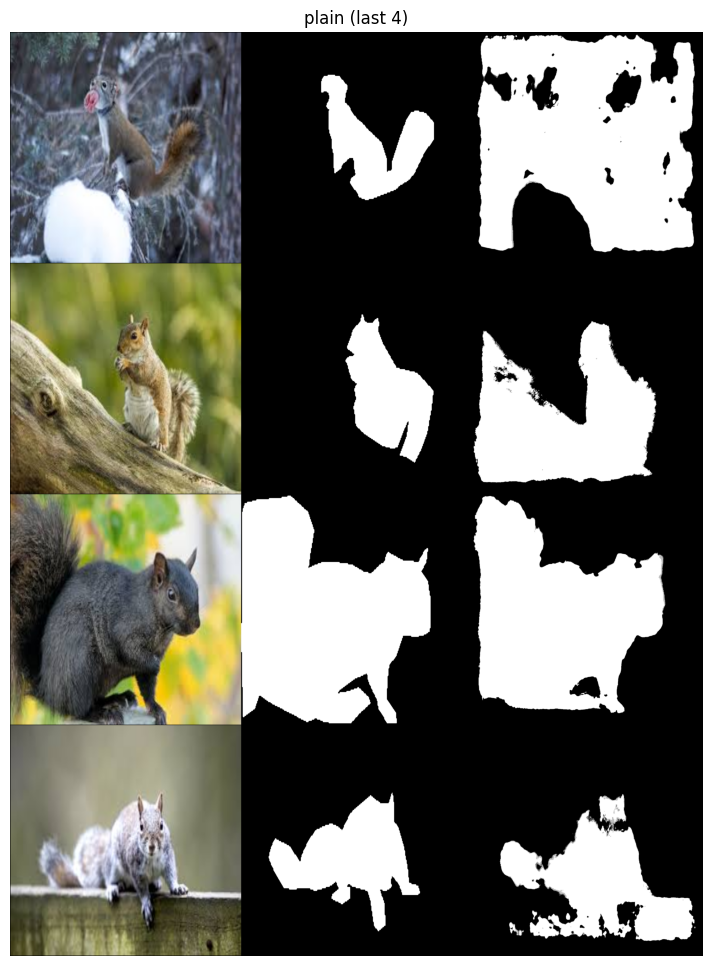

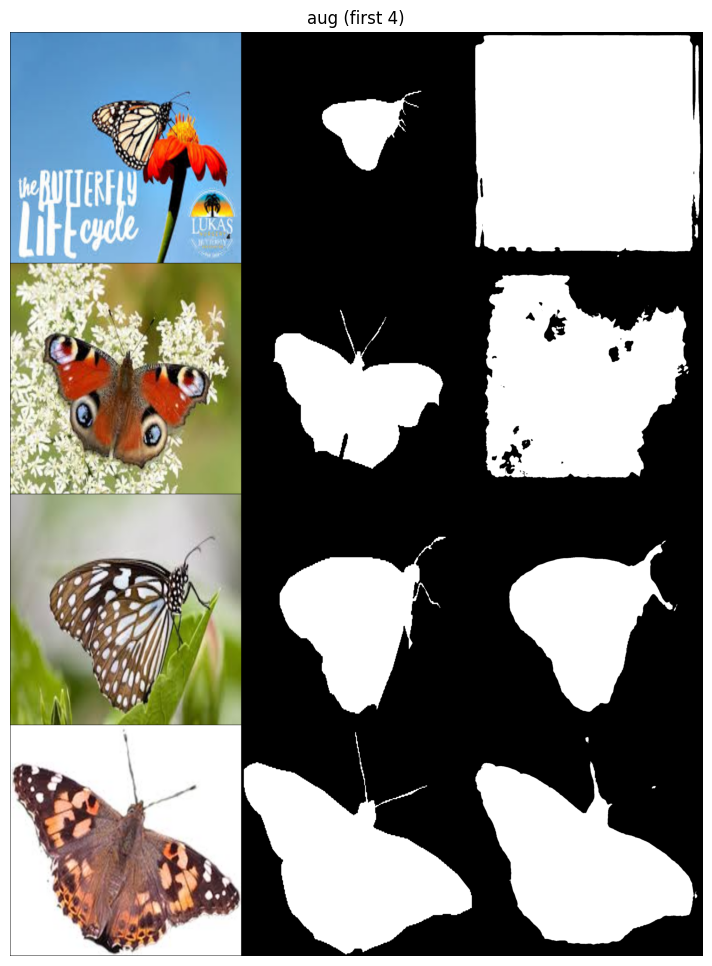

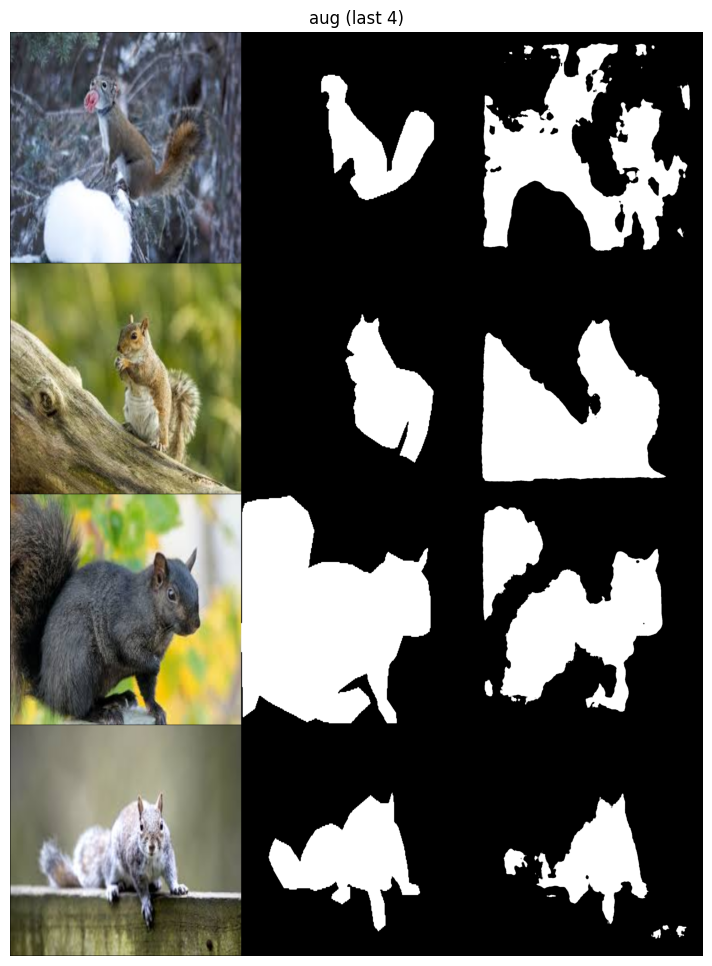

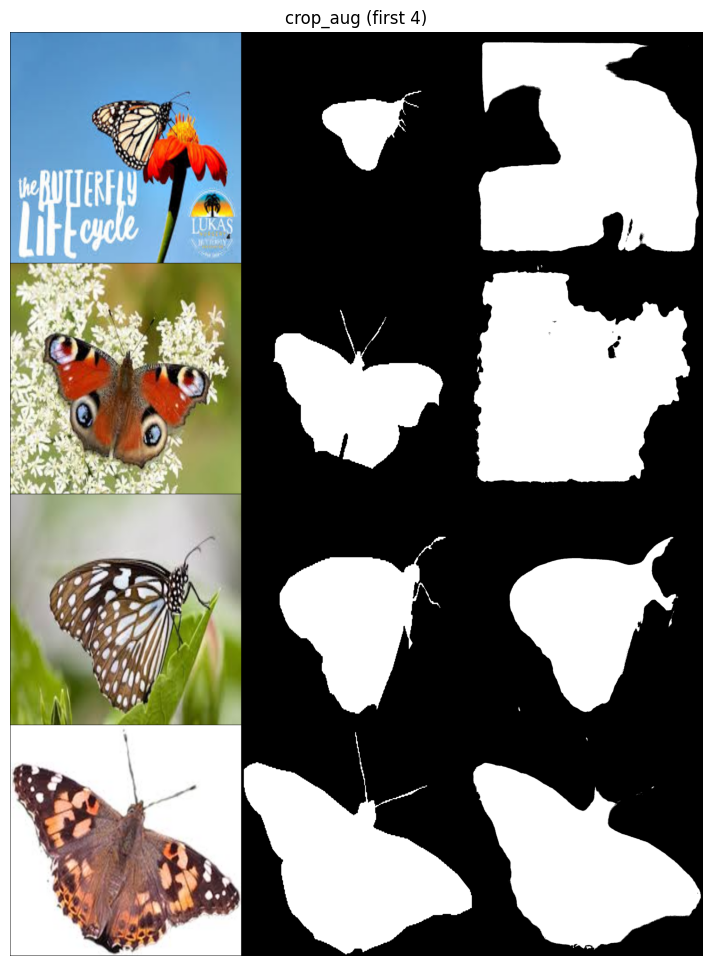

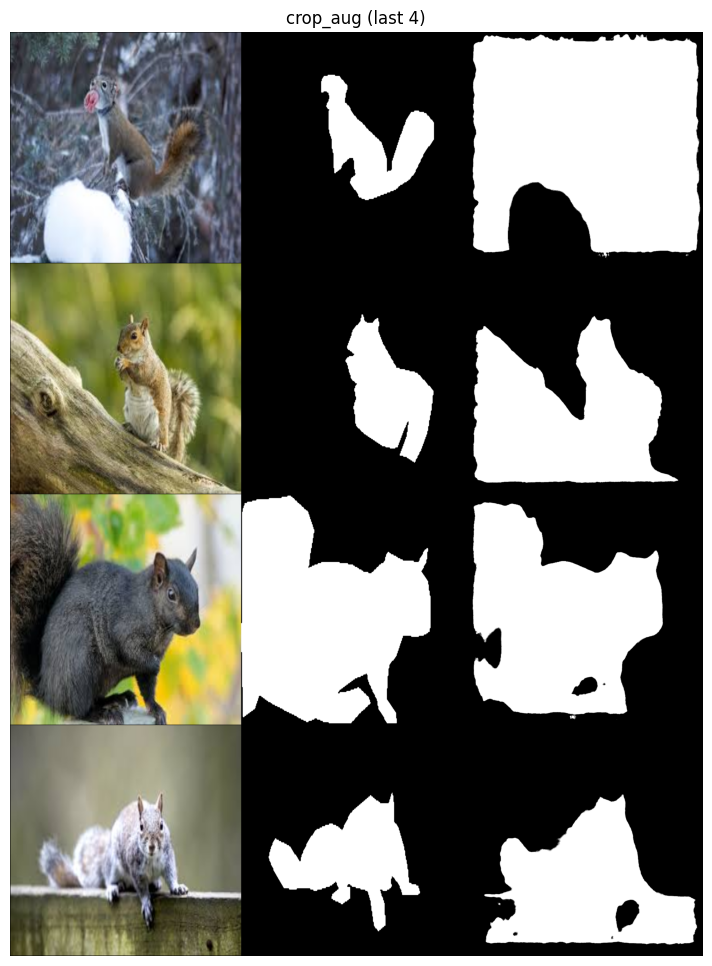

In [26]:
from torchvision.utils import make_grid

def show_comparison(name, loader, ckpt_path, n=4, th=0.5):
    """
    Show comparison of first and last n samples in dataset.

    Args:
        name (str): dataset name
        loader: DataLoader
        ckpt_path (str): checkpoint path
        n (int): number of samples to visualize (default=4)
        th (float): threshold for binarizing predictions
    """
    if not os.path.exists(ckpt_path):
        print(f"⚠️ no checkpoint for {name}")
        return
    
    # Load model
    model = AttentionUNet(in_channels=3, out_channels=1).to(DEVICE)
    chk = torch.load(ckpt_path, map_location=DEVICE)
    model.load_state_dict(chk.get("model_state_dict", chk.get("state_dict", chk)))
    model.eval()

    # Get dataset (not just one batch!)
    dataset = loader.dataset
    indices_sets = [list(range(n)), list(range(len(dataset)-n, len(dataset)))]  # first n, last n

    for idx_set, label in zip(indices_sets, ["first", "last"]):
        imgs = torch.stack([dataset[i][0] for i in idx_set]).to(DEVICE)
        masks = torch.stack([dataset[i][1] for i in idx_set])
        if masks.dim() == 3:
            masks = masks.unsqueeze(1)

        with torch.no_grad():
            preds = model(imgs)
            if preds.shape[1] == 1:
                preds_bin = (torch.sigmoid(preds) > th).float()
            else:
                preds_bin = (torch.softmax(preds, dim=1).argmax(dim=1, keepdim=True) > 0).float()

        imgs_cpu  = imgs.cpu()
        masks_cpu = masks.cpu()
        preds_cpu = preds_bin.cpu()

        rows = []
        for i in range(imgs_cpu.size(0)):
            img = imgs_cpu[i]                    # 3xHxW
            gt  = masks_cpu[i].repeat(3,1,1)     # 3xHxW
            pr  = preds_cpu[i].repeat(3,1,1)     # 3xHxW
            rows.append(torch.cat([img, gt, pr], dim=2))  # img | gt | pred

        grid = make_grid(rows, nrow=1)
        plt.figure(figsize=(12, 3 * n))
        plt.imshow(grid.permute(1,2,0))
        plt.axis('off')
        plt.title(f"{name} ({label} {n})")
        plt.show()



show_comparison("plain",   test_loader_plain,   "checkpoints/plain_checkpoint.pth.tar", n=4)
show_comparison("aug",     test_loader_aug,     "checkpoints/aug_checkpoint.pth.tar",   n=4)
show_comparison("crop_aug",test_loader_cropaug, "checkpoints/crop_aug_checkpoint.pth.tar", n=4)


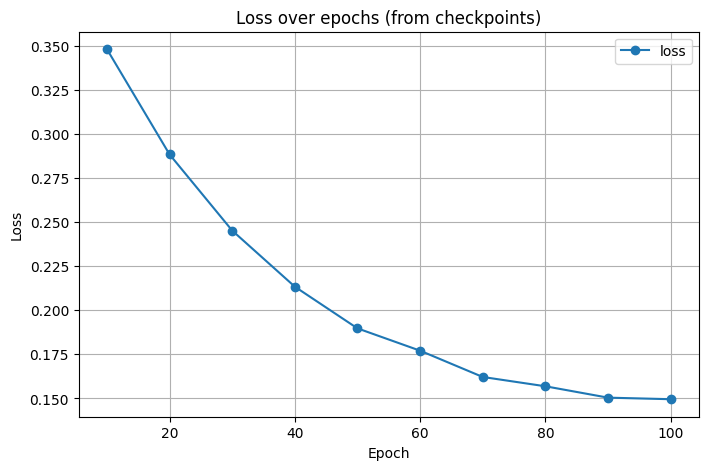

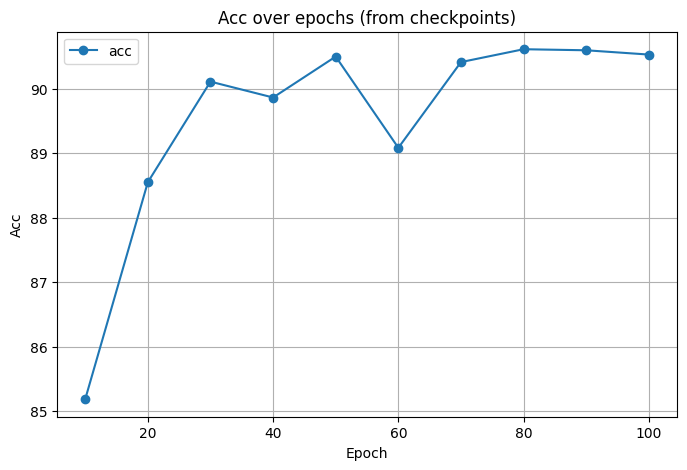

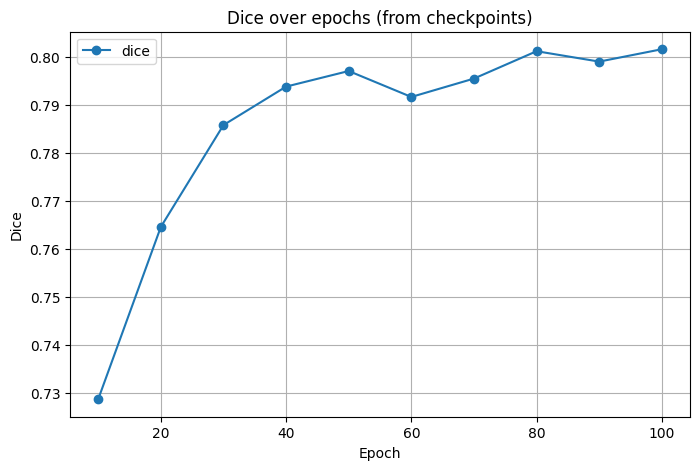

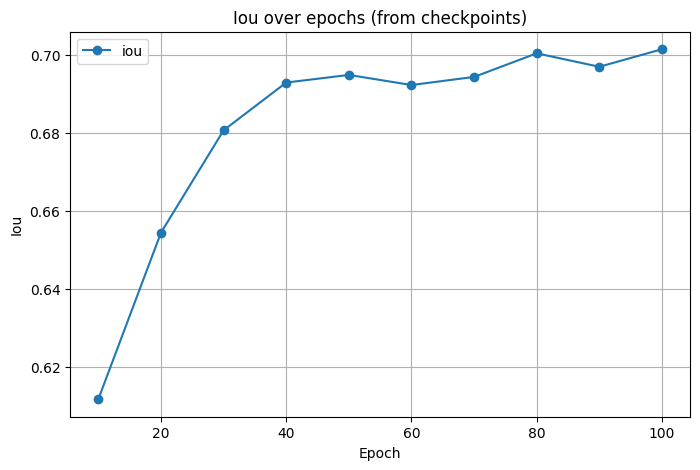

In [ ]:
train_plain = False
tester = Test(train_loader_plain, test_loader_plain, num_epochs=100, early_stop_patience=15)
if train_plain == True:
    tester.train_all()

checkpoint_paths  = ["checkpoints/epoch_"+ str(x) + ".pth.tar" for x in range(10,110,10) ]
# Plot metrics
tester.plot_metrics(checkpoint_paths)

train_combined_aug = True

train_crop_aug_tester = Test(train_loader_cropaug, test_loader_plain, num_epochs=100, early_stop_patience=15)
if train_combined_aug == True:
    train_crop_aug_tester.train_all(checkpoints_dir= "checkpoints/crop_aug/")

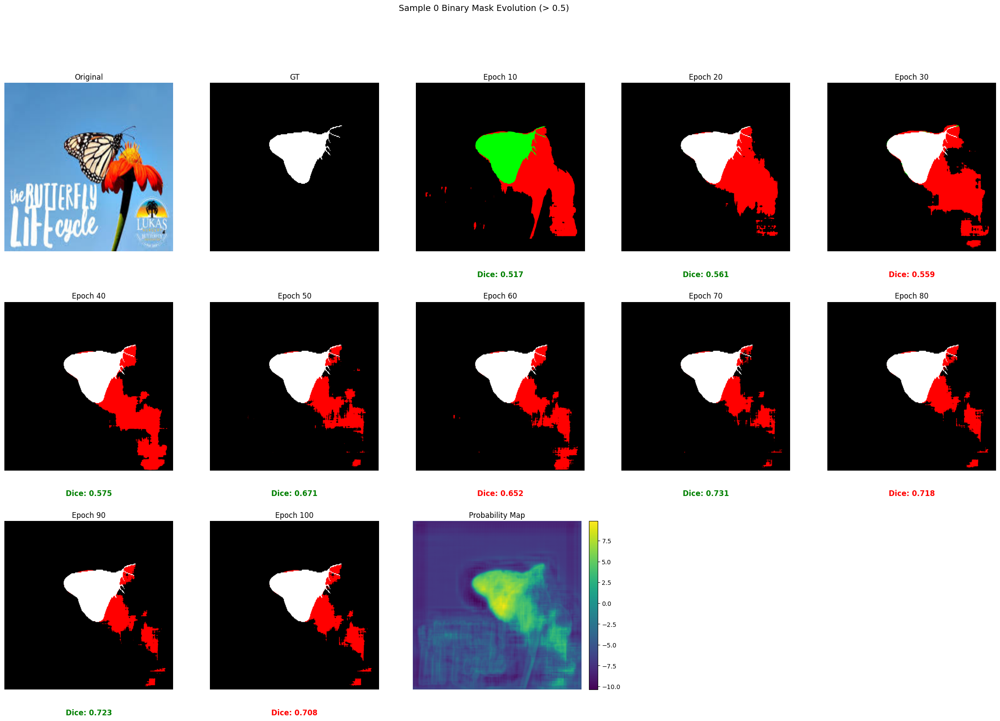

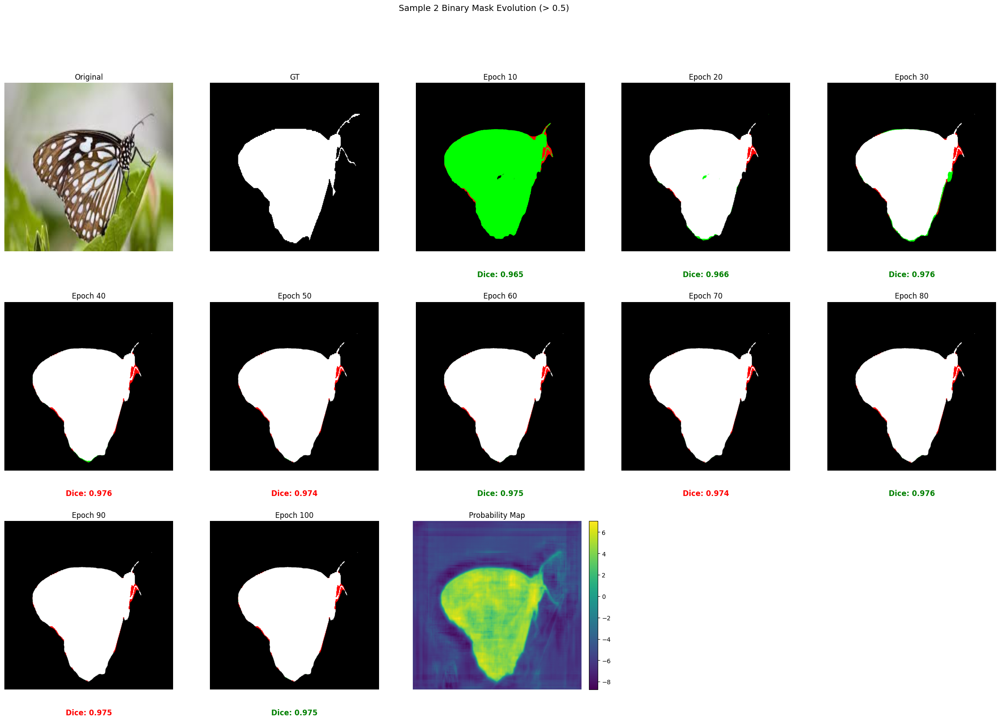

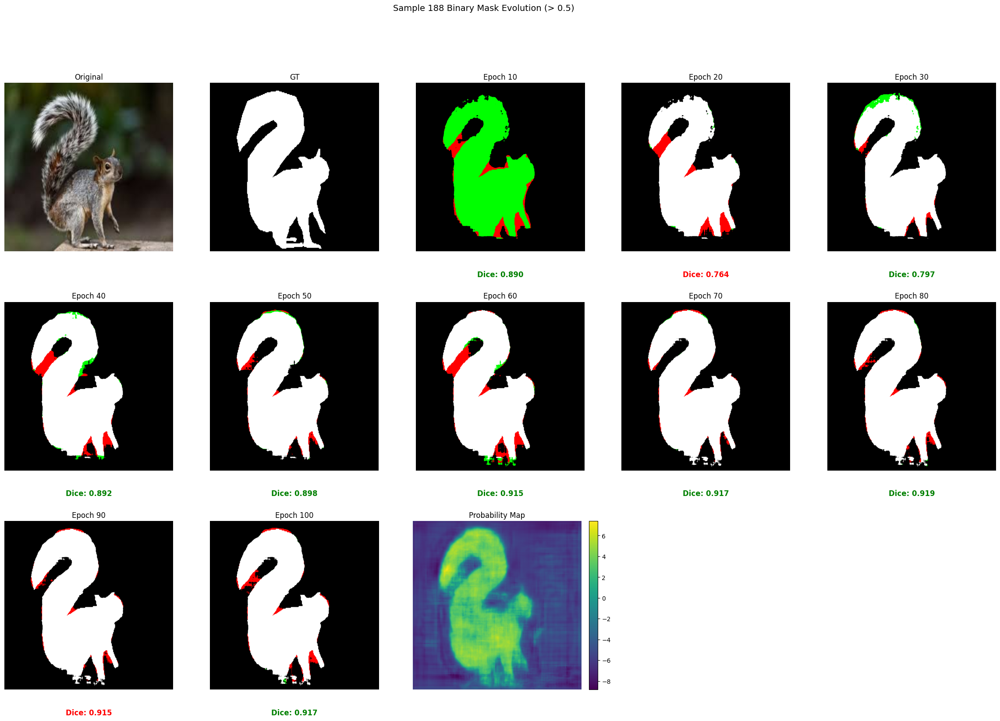

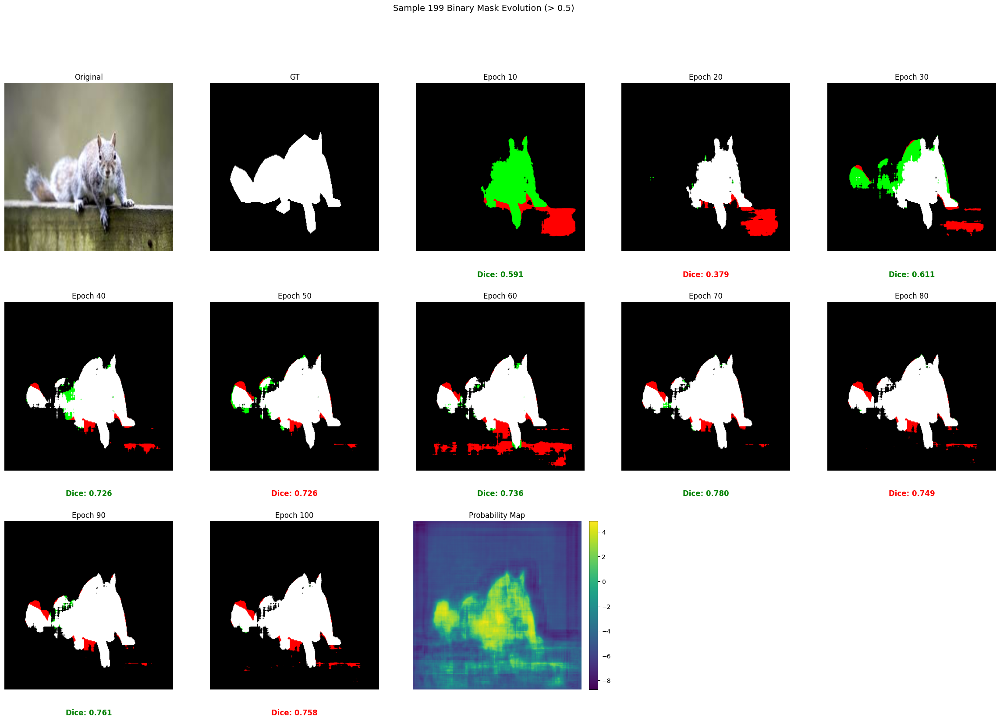

In [31]:

test_dataset = test_loader_plain.dataset

# Run test
tester.visualize_binary_mask_evolution(
    indices=[0,2,188,199],             # visualize random samples
    test_dataset=test_dataset, 
    checkpoint_paths=checkpoint_paths,
    threshold=0.5,
    row=None,                  # let function compute optimal row
    col=5,                     # max 5 columns
    base_figsize=(6,6),        # scale figure size
    show_prob_map=True          # include probability heatmap
)

In [30]:
model = AttentionUNet(in_channels=3, out_channels=1).to(DEVICE)

# 2. Load trained weights from a checkpoint
chk = torch.load("checkpoints/epoch_100.pth.tar", map_location=DEVICE)
model.load_state_dict(chk['model_state_dict'])
model.eval()  # important for evaluation

# 3. Evaluate
acc, dice, iou = check_accuracy(test_loader_plain, model, device=DEVICE)

# 4. Print results
print(f"Pixel Accuracy: {acc:.2f}%")
print(f"Mean Dice: {dice:.4f}")
print(f"Mean IoU: {iou:.4f}")


Evaluating:   0%|          | 0/50 [00:00<?, ?it/s]

Pixel Accuracy: 90.53%
Mean Dice: 0.8015
Mean IoU: 0.7015
